In [ ]:
import cv2
import os
import numpy as np

import matplotlib.pyplot as plt

# Загрузка данных

В рамках данного семинара предлагается поработать с изображениями с конкурса по анализу данных Proppant Check Challenge. Описание задачи и данных можно посмотреть на сайте соревнования: https://boosters.pro/championship/RPCC

In [ ]:
!wget https://boosters.pro/api/ch/files/pub/RPCC_train.zip

--2022-03-08 06:48:17--  https://boosters.pro/api/ch/files/pub/RPCC_train.zip
Resolving boosters.pro (boosters.pro)... 91.206.14.169
Connecting to boosters.pro (boosters.pro)|91.206.14.169|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 975138118 (930M) [application/zip]
Saving to: ‘RPCC_train.zip’

RPCC_train.zip      100%[===================>] 929.96M  21.6MB/s    in 44s     

2022-03-08 06:49:02 (20.9 MB/s) - ‘RPCC_train.zip’ saved [975138118/975138118]



In [ ]:
!unzip -q RPCC_train.zip

In [ ]:
# Import PyDrive and associated libraries.
# This only needs to be done once per notebook.
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# Authenticate and create the PyDrive client.
# This only needs to be done once per notebook.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

# Download a file based on its file ID.
#
# A file ID looks like: laggVyWshwcyP6kEI-y_W3P8D26sz
file_id = '1NYwDvq-mSXKwcKZyK0VoGbD6J3dnMoU1'
downloaded = drive.CreateFile({'id': file_id})

# Save file to disk
downloaded.GetContentFile('instances.json')

# Download a file based on its file ID.
#
# A file ID looks like: laggVyWshwcyP6kEI-y_W3P8D26sz
file_id = '1O2HUPJNw5EdYLN8FucT13Zp3x96IEtnZ'
downloaded = drive.CreateFile({'id': file_id})

# Save file to disk
downloaded.GetContentFile('template.png')

In [ ]:
TRAIN_FOLDER = 'train'

# Работа с изображением

Основным заданием будет создание алгоритма предобработки изображений для решения следующей задачи:

**Входные данные:** фотография листа бумаги с нанесенным шаблоном и рассыпанным пропаннатом

**Выходные данные:** кроп входного изображения, содержащего только область с проппанатом.

In [ ]:
IMAGE_ID = 1

In [ ]:
img = cv2.imread(os.path.join(TRAIN_FOLDER, str(IMAGE_ID) + '.jpg'))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

Изображения в датасете сняты на камеру мобильного телефона под некоторым углом и с некоторого расстояния:

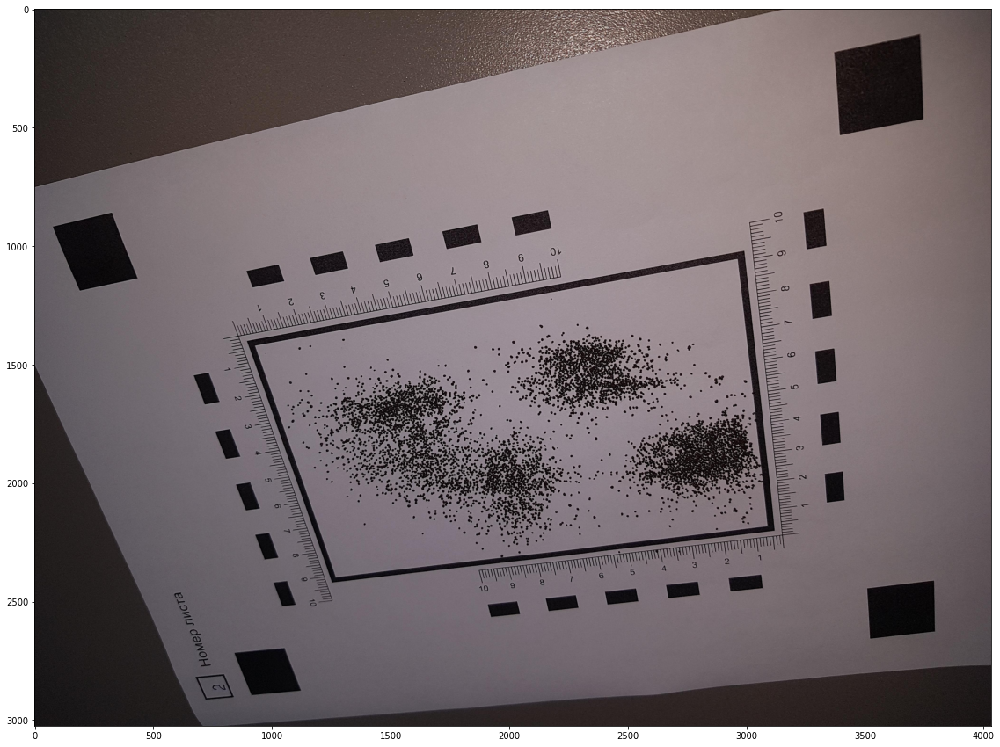

In [ ]:
plt.figure(figsize=[20, 15])
plt.imshow(img)

На всех фотографиях снят лист бумаги с распечатанным шаблоном и рассыпанным на нем проппанатом. Шаблон извествен:

In [ ]:
template = cv2.imread('template.png')

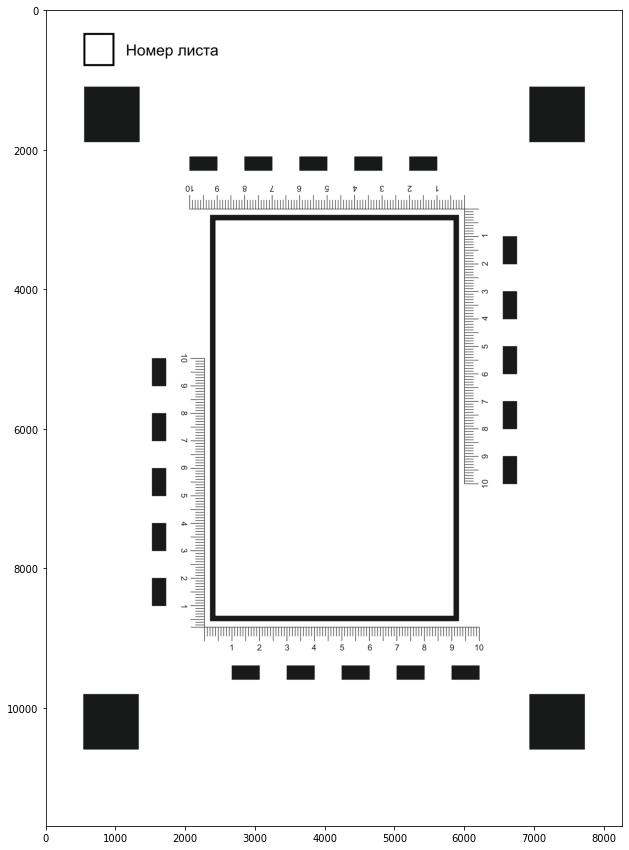

In [ ]:
plt.figure(figsize=[20, 15])
plt.imshow(template)

Далее рассмотрим примеры использования алгоритмов, которые могут быть полезны при решении данной задачи извлечения области с проппанатом.

### Бинаризация

Туториал: https://docs.opencv.org/4.x/d7/d4d/tutorial_py_thresholding.html

Реализация обычной пороговой бинаризации в OpenCV представлена функцией cv2.threshold с флагом cv2.THRESH_BINARY. Другие флаги, такие как cv2.THRESH_TRUNC
cv2.THRESH_TOZERO определяют, будут ли изменены значения ниже или выше порога

In [ ]:
ret, th_const = cv2.threshold(
    gray,                   # входное изображение
    128,                    # порог бинаризации
    255,                    # максимальное значения пикселя изображения
    cv2.THRESH_BINARY       # способ бинаризации (cv2.THRESH_BINARY, cv2.THRESH_BINARY_INV, cv2.THRESH_TRUNC, cv2.THRESH_TOZERO, cv2.THRESH_TOZERO_INV)
)

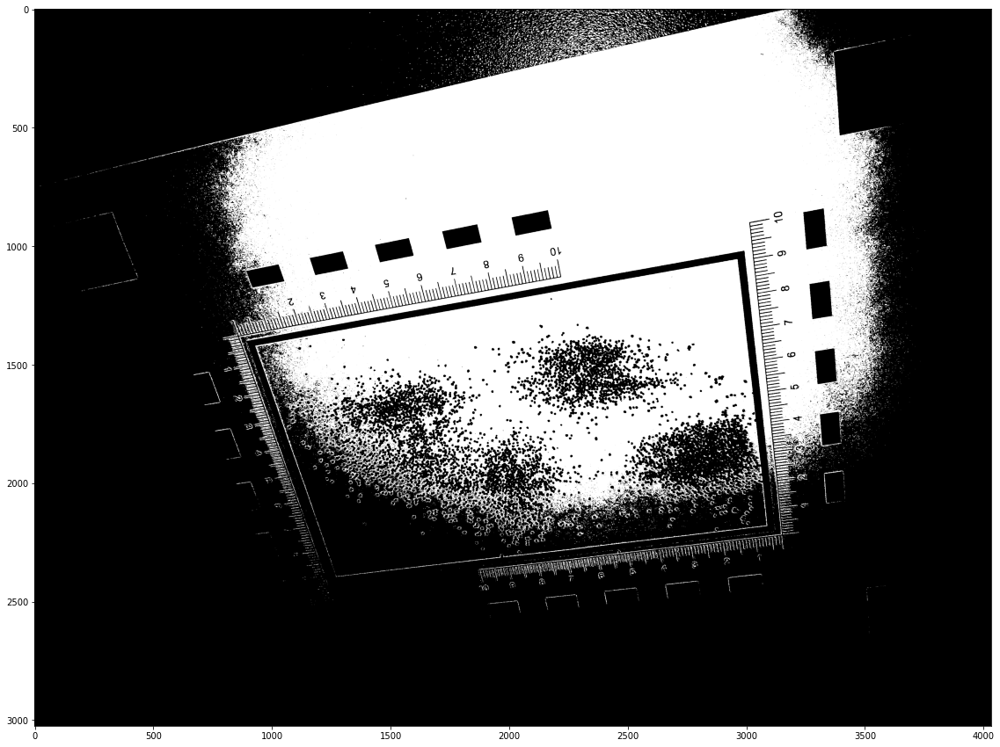

In [ ]:
plt.figure(figsize=[20, 15])
plt.imshow(th_const, cmap='Greys_r')

# Вопрос 1
В чем заключается недостаток обычной бинаризации по константному порогу?

**Ответ:**

Недостаток подхода очевиден. Впрочем, можно попробовать подобрать оптимальный порог вручную, основываясь на визуальной оценке качества бинаризации, или осуществить поиск оптимального порога по методу Отсу. Делается это передачей дополнительного флага cv2.THRESH_OTSU:

In [ ]:
ret, th_otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

In [ ]:
print('Оптимальный порог бинаризации по Отсу: ', ret)

Оптимальный порог бинаризации по Отсу:  79.0


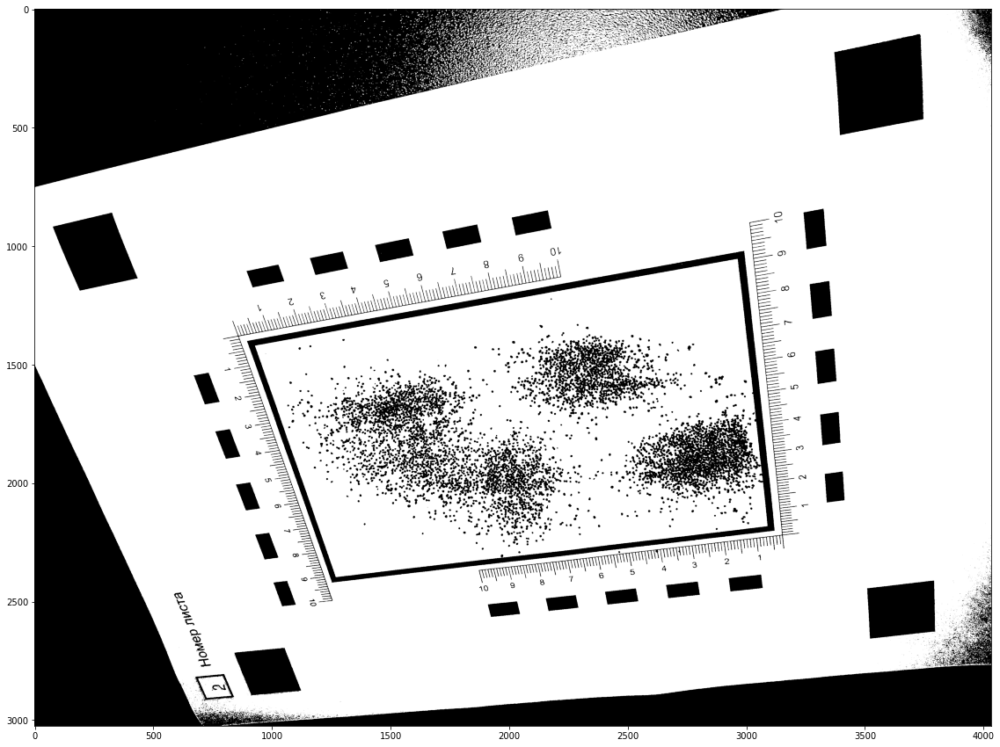

In [ ]:
plt.figure(figsize=[20, 15])
plt.imshow(th_otsu, cmap='Greys_r')

Уже значительно лучше. Но попробуем адаптивную бинаризацию

### Адаптивная бинаризация

Туториал: https://docs.opencv.org/4.x/d7/d4d/tutorial_py_thresholding.html

Адаптивная бинаризация в OpenCV представлена методом cv2.adaptiveThreshold:

In [ ]:
th_adaptive = cv2.adaptiveThreshold(
    gray,                        # входное изображение
    255,                         # максимальное значения пикселя изображения
    cv2.ADAPTIVE_THRESH_MEAN_C,  # способ вычисления порога (cv2.ADAPTIVE_THRESH_MEAN_C - среднее, cv.ADAPTIVE_THRESH_GAUSSIAN_C - взвешенное среднее, с весами по гауссиане)
    cv2.THRESH_BINARY,           # способ бинаризации (те же, что и для неадаптивной)
    51,                           # размер окрестности пикселя, рассматриваемой при вычислении порога (должна быть нечетной)
    0                            # это значение вычитается из вычисленного порога, полученная величина - фактический порог бинаризации
)

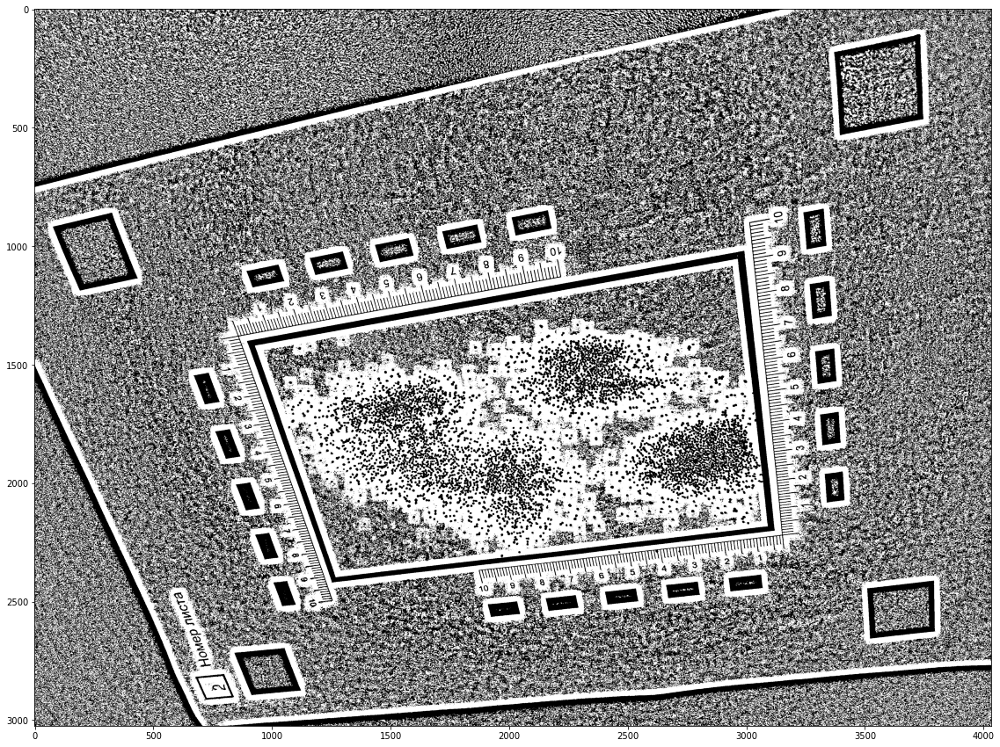

In [ ]:
plt.figure(figsize=[20, 15])
plt.imshow(th_adaptive, cmap='Greys_r')

Получилось не очень, но, возможно, поможет подбор параметров!

# Вопрос 2

Исходя из результатов работы адаптивной бинаризации, попробуйте определить, какие характеристики исходного изображения могли привести к таким результатам? Другими словами, устойчивость к каким характеристикам входных данных требуется повысить с помощью варьирования параметров или применения дополнительных методов для того, чтобы улучшить результат?

**Ответ:**

### Морфологические преобразования

Туториал: https://docs.opencv.org/3.4/d9/d61/tutorial_py_morphological_ops.html

Попробуем 'очистить' результаты адаптивной бинаризации, сохранив только ярко выраженные границы. Достигнуть этого можно с помощью морфологического преобразования 'opening' (открытия, раскрытия):

In [ ]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(9, 9))
th_adaptive_cl = cv2.morphologyEx(th_adaptive, cv2.MORPH_CLOSE, kernel, None, None, 2)
print('Ядро морфилогической операции:\n\n', kernel)

Ядро морфилогической операции:

 [[0 0 0 0 1 0 0 0 0]
 [0 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 0]
 [1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 0]
 [0 0 0 0 1 0 0 0 0]]


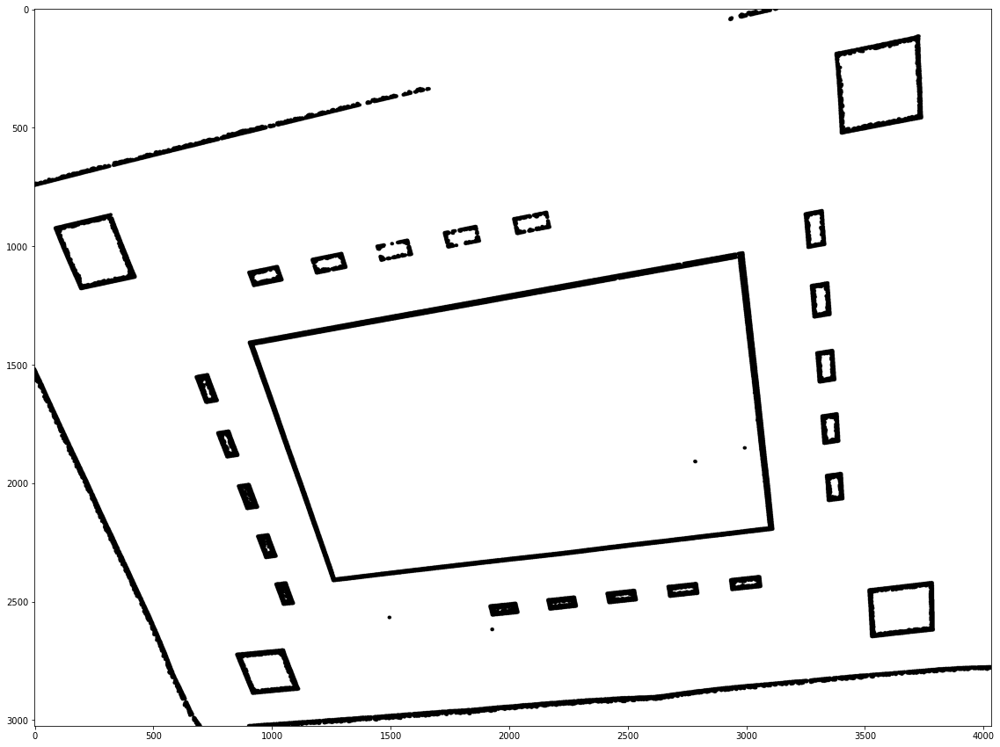

In [ ]:
plt.figure(figsize=[20, 15])
plt.imshow(th_adaptive_cl, cmap='Greys_r')

### Выделение границ

Туториал: https://docs.opencv.org/3.4/da/d22/tutorial_py_canny.html

Для выделения границ наиболее популярным является метод Канни:

In [ ]:
edges = cv2.Canny(
    th_otsu,    # входное изображение
    100,        # нижний порог гистерезиса
    200,        # верхний порог гистерезиса
    None,       # буфер для ребер, укажем None, так как воспользуемся возвращаемым значением
    3,          # размер ядра дифференциального оператора Собеля
    True        # False/True L1/L2 норма для вичисления отклика по производным
)

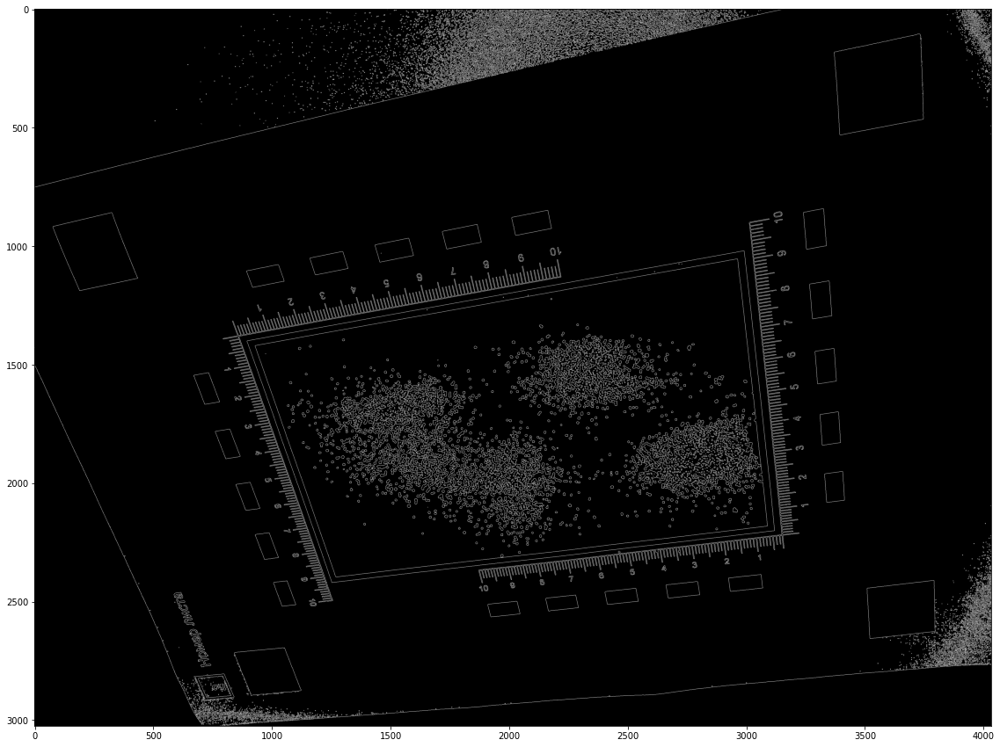

In [ ]:
plt.figure(figsize=[20, 15])
plt.imshow(edges, cmap='Greys_r')

# Вопрос 3
Для чего применяется процедура гистерезиса в детекторе Канни? Как влияют на результат пороги гистерезиса?

**Ответ:**

### Выделение контуров

Туториал: https://docs.opencv.org/4.x/d4/d73/tutorial_py_contours_begin.html

Для работы с контурами могут быть полезны следующие средства:

1. cv2.findContours - поиск контуров
2. cv2.contourArea - площадь фигуры, ограниченной контуром
3. cv2.arcLength - длина контура
4. cv2.isContourConvex - проверка на выпуклость
5. cv2.approxPolyDP - аппроксимация контура более простым (состоящим из меньшего числа звеньев)
6. cv2.drawContours - отрисовка контуров

In [ ]:
contours, hierarchy = cv2.findContours(
    th_otsu,                 # входное изображение, бинаризованное
    cv2.RETR_TREE,           # восстановить иерархию контуров по вложенности друг в друга
    cv2.CHAIN_APPROX_NONE    # не аппроксимировать контуры
)

In [ ]:
img_countours = img.copy()
img_countours = cv2.drawContours(img_countours, contours, -1, (255,0,0), 3)
None

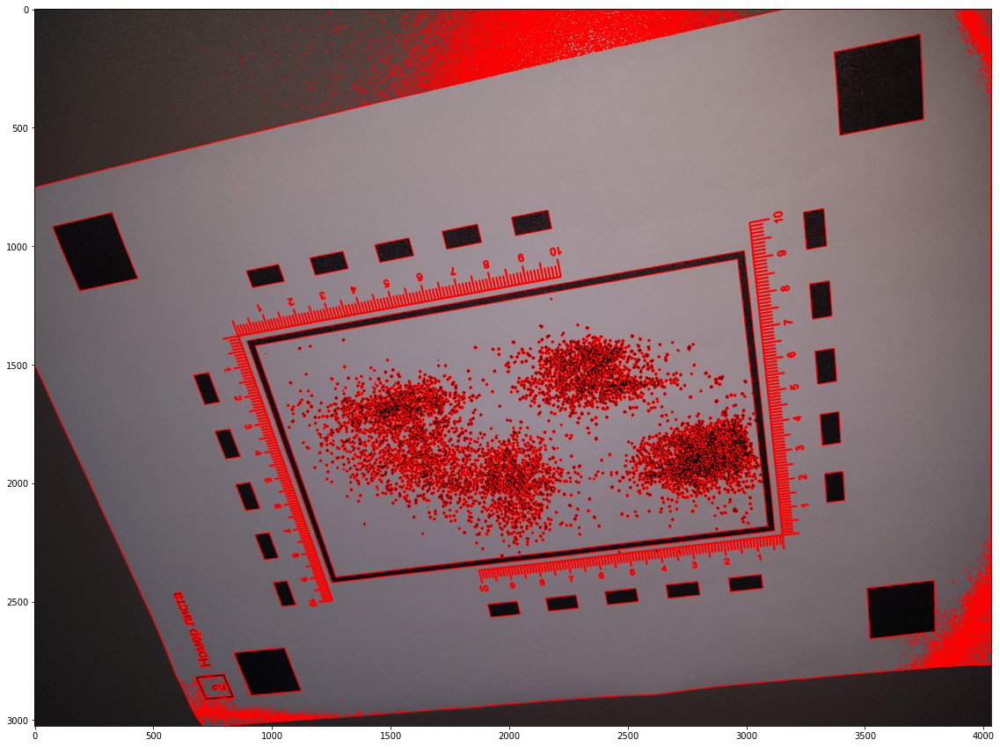

In [ ]:
plt.figure(figsize=[20, 15])
plt.imshow(img_countours)

# Вопрос 4
На лекции были рассмотрен методы сопоставления с шаблоном (анализ краев, кросс-корреляция). В нашей задаче тоже есть изображение и шаблон. Оцените применимость этих методов в задаче.

**Ответ:**

### Задание 1

Используя средства OpenCV реазизуйте извлечение области с пропаннатом из изображения. Продемонстрируйте работу предложенного подхода еще на 2х изображениях. Также приведите пример минимум 2-х изображений, где проявляются его недостатки. Предложите (на словах) как их можно исправить.

Примечание: возможно, для выполнения задания дополнительно понадобится применить методы подавления шума и гистограмных преобразаваний, которые были рассмотрены на предыдущих семинарах. Для извлечения прямоугольной области понадобится аппарат проективных преобразований, представленный функциями cv2.getPerspectiveTransform - по 4 парам соответствующих точек выдает матрицу гомографии, cv2.warpPerspective - применяет преобразование гомографии.

### Пример промежуточных результатов для Задания 1

Сначала выделим границы на изображении. К ним будут отнесены границы поисковых узоров в том числе. Но не только они. Кроме того присутствует шум типа "перец". Его можно удалить, но, как дальше было выяснено, это не влияет на качество выделения линий.

Примечание: это не результат работы детектора Canny

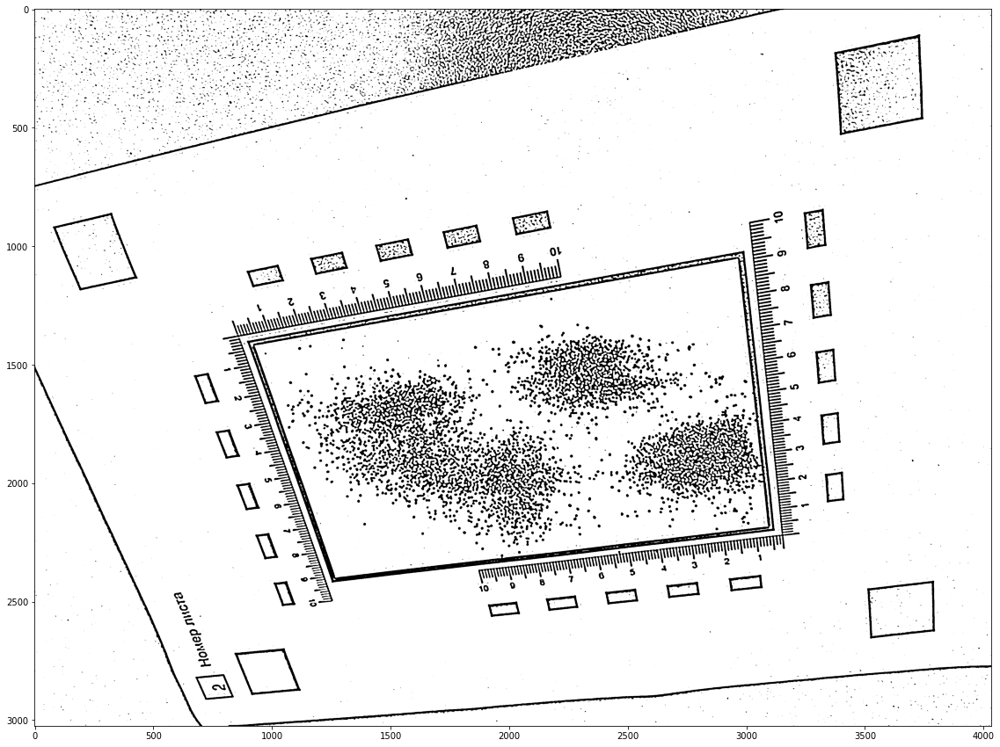

In [ ]:
# НЛО прилетело и удалило весь код

Теперь обнаружим прямоугольники, по полученному бинаризованному изображению с границами:

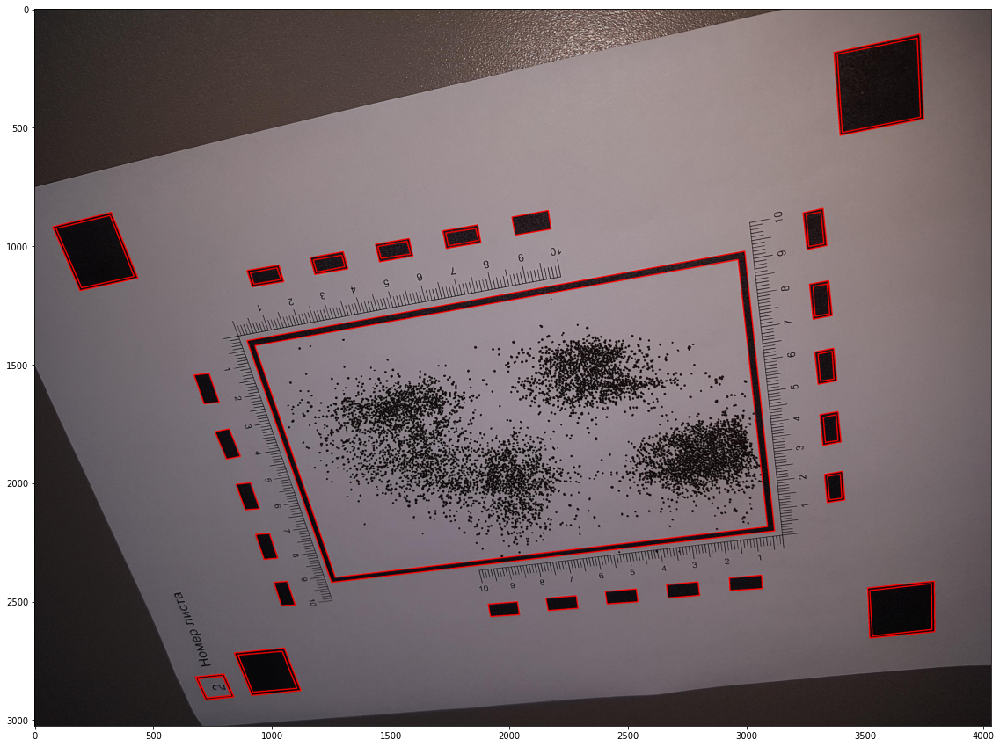

In [ ]:
# НЛО прилетело и удалило весь код

Остается выделить целевую область с пропаннатом и произвести выравнивание

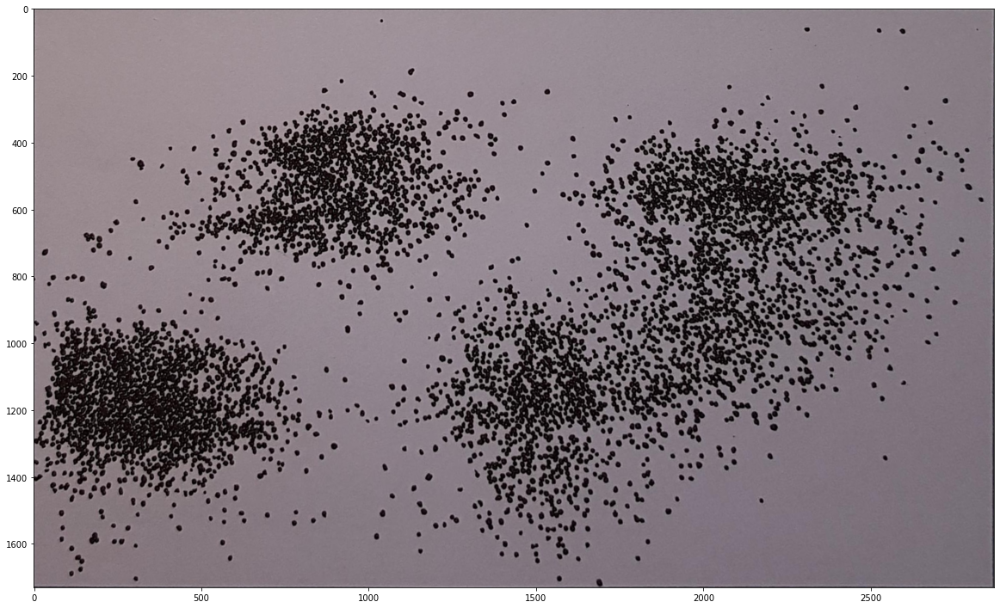

In [ ]:
# НЛО прилетело и удалило весь код